Project 1 - California Water Usage
=================

Welcome to the first project in Data 3401! We will be exploring possible connections between water usage, geography, and income in California. The water data for this project was procured from the [California State Water Resources Control Board](http://www2.pacinst.org/gpcd/table.html) and curated by the [Pacific Institute](http://pacinst.org/). The map data includes [US topography](https://github.com/jgoodall/us-maps), [California counties](https://github.com/johan/world.geo.json/tree/master/countries/USA/CA), and [ZIP codes](http://bl.ocks.org/jefffriesen/6892860).

The dataset on income comes from the IRS ([documented here](http://www.irs.gov/pub/irs-soi/13zpdoc.doc)).  We have identified some interesting columns in the dataset, but a full description of all the columns (and a definition of the population in the dataset and some interesting anonymization procedures they used) is available [here](irs_info.pdf).


##### Due Date
The entire project (parts 1, 2, and 3) will be due **Tuesday, March 6 at 11:59PM**. 

#### On to the project!
As usual, **run the cell below** to prepare the automatic tests. **Passing the automatic tests does not guarantee full credit on any question.** The tests are provided to help catch some common errors, but it is *your* responsibility to answer the questions correctly.

In [1]:
# Run this cell, but please don't change it.

import numpy as np
import math
from datascience import *

# These lines block warnings
import warnings
warnings.simplefilter(action="ignore",category=FutureWarning)

# These lines set up the plotting functionality and formatting.
import matplotlib
matplotlib.use('Agg', warn=False)
%matplotlib inline
import matplotlib.pyplot as plots
plots.style.use('fivethirtyeight')


First, load the data. Loading may take some time.

In [2]:
# Run this cell, but please don't change it.

districts = Map.read_geojson('water_districts.geojson')
zips = Map.read_geojson('ca_zips.geojson.gz')
usage_raw = Table.read_table('water_usage.csv', dtype={'pwsid': str})
income_raw = Table.read_table('ca_income_by_zip.csv', dtype={'ZIP': str}).drop('STATEFIPS', 'STATE', 'agi_stub')
wd_vs_zip = Table.read_table('wd_vs_zip.csv', dtype={'PWSID': str, 'ZIP': str}).set_format(make_array(2, 3), PercentFormatter)

Part 1: Maps
======

The `districts` and `zips` data sets are `Map` objects. Documentation on mapping in the `datascience` package can be found at [data8.org/datascience/maps.html](http://data8.org/datascience/maps.html).  To view a map of California's water districts, run the cell below. Click on a district to see its description.

In [3]:
districts

A `Map` is a collection of regions and other features such as points and markers, each of which has a **string** `id` and various properties. You can view the features of the `districts` map as a table using `Table.from_records`.

In [4]:
district_table = Table.from_records(districts.features)
district_table.show(3)

C:\Users\lebri\Anaconda3\lib\site-packages\folium\folium.py:504: UserWarning: This method is deprecated. Please use Map.choropleth instead.
  warnings.warn('This method is deprecated. '


To display a `Map` containing only two features from the `district_table`, call `Map` on an array containing those two features from the `feature` column.

**Question 1.1.** Draw a map of the Alameda County Water District (row 0) and the East Bay Municipal Utilities District (row 2).

In [27]:
# Fill in the next line so the last line draws a map of those two districts.
#alameda_and_east_bay = district_table.row(0)[1]
alameda_and_east_bay = district_table.take(range(0,3,2))[1]  #pick id 0 and 2. I know there is another way but i found this with range to be easier. 
Map(alameda_and_east_bay, height=300, width=300)

C:\Users\lebri\Anaconda3\lib\site-packages\folium\folium.py:504: UserWarning: This method is deprecated. Please use Map.choropleth instead.
  warnings.warn('This method is deprecated. '


In [28]:
_ = tests.grade('q11')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 2
    Failed: 0
[ooooooooook] 100.0% passed



*Hint*: If scrolling becomes slow on your computer, you can clear maps for the cells above by running `Cell > All Output > Clear` from the `Cell` menu. 

Part 2: California Income
=======

Let's look at the `income_raw` table, which comes from the IRS.  We're going to link this information about incomes to our information about water. First, we need to investigate the income data and get it into a more usable form.

In [6]:
income_raw

ZIP,N1,MARS1,MARS2,MARS4,PREP,N2,NUMDEP,A00100,N02650,A02650,N00200,A00200,N00300,A00300,N00600,A00600,N00650,A00650,N00700,A00700,N00900,A00900,N01000,A01000,N01400,A01400,N01700,A01700,SCHF,N02300,A02300,N02500,A02500,N26270,A26270,N02900,A02900,N03220,A03220,N03300,A03300,N03270,A03270,N03150,A03150,N03210,A03210,N03230,A03230,N03240,A03240,N04470,A04470,A00101,N18425,A18425,N18450,A18450,N18500,A18500,N18300,A18300,N19300,A19300,N19700,A19700,N04800,A04800,N05800,A05800,N09600,A09600,N07100,A07100,N07300,A07300,N07180,A07180,N07230,A07230,N07240,A07240,N07220,A07220,N07260,A07260,N09400,A09400,N10600,A10600,N59660,A59660,N59720,A59720,N11070,A11070,N10960,A10960,N06500,A06500,N10300,A10300,N85330,A85330,N85300,A85300,N11901,A11901,N11902,A11902
90001,13100,6900,1890,4270,10740,29670,15200,181693,13100,184344,10220,142287,640,96,50,69,30,20,180,55,3490,31751,70,-17,60,382,380,3001,0,950,4493,80,123,30,105,3510,2651,20,6,0,0,0,0,0,0,150,119,60,98,0,0,510,7212,8498,170,95,270,154,340,952,500,1424,340,3168,240,363,4200,20798,4190,2176,0,0,1800,623,0,0,70,28,520,248,240,39,1020,304,0,0,3290,4659,12180,37759,6320,20531,5880,16995,6500,8805,1230,980,2680,1554,5800,6197,0,0,0,0,1220,856,11480,32934
90001,5900,1700,1970,2210,4960,17550,9690,203628,5900,204512,5610,188556,830,68,60,32,70,19,660,351,540,5917,60,111,50,489,310,4450,0,460,2522,210,947,40,831,700,885,50,12,0,0,0,0,50,152,200,154,50,81,0,0,1260,20442,46800,800,1023,430,505,810,2383,1250,4605,820,7172,870,1620,5300,74352,5290,8710,0,0,3380,2947,0,0,370,249,620,518,630,114,2520,2047,20,6,410,982,5820,23531,2160,4562,1890,3948,2520,4160,600,441,3180,5762,3460,6754,0,0,0,0,530,797,5360,17656
90001,1480,330,760,390,1240,4710,2470,89065,1480,89344,1440,82579,400,32,20,12,0,0,460,477,130,1351,40,1,40,660,140,2599,0,150,892,60,670,0,0,210,279,50,14,0,0,0,0,0,0,90,76,0,0,0,0,680,13264,41920,540,1329,120,294,500,1453,680,3591,490,4248,560,1296,1470,49298,1470,6618,0,0,900,1488,0,0,120,90,180,198,80,11,750,1163,20,7,80,232,1470,8950,0,0,0,0,190,256,170,132,1290,5131,1310,5417,0,0,0,0,230,520,1250,4050
90001,330,50,210,70,290,1100,560,28395,330,28555,320,25271,130,10,20,24,30,29,160,235,60,1084,0,0,0,0,40,1044,0,40,230,30,598,0,0,60,160,0,0,0,0,0,0,0,0,30,21,0,0,0,0,210,4846,18256,190,734,30,67,160,477,210,1437,160,1488,180,514,330,17918,330,2627,0,0,190,380,0,0,50,37,60,66,0,0,180,309,0,0,40,191,330,3127,0,0,0,0,0,0,50,41,330,2247,330,2398,0,0,0,0,70,289,270,1014
90001,160,30,100,40,130,510,250,24676,160,25017,150,17851,70,35,20,71,0,0,70,140,0,0,20,88,0,0,20,477,0,0,0,0,0,20,2967,40,186,0,0,0,0,0,0,0,0,0,0,0,0,0,0,130,4063,20530,120,1362,0,0,100,447,130,1980,90,1086,100,429,160,18375,160,3889,30,124,80,145,0,0,0,0,0,0,0,0,60,74,0,0,0,0,160,3868,0,0,0,0,0,0,0,0,160,3723,160,3897,0,0,0,0,60,702,100,474
90001,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
90002,12150,6330,1460,4330,9580,27240,14070,167261,12150,170095,9440,126482,610,73,50,19,40,9,150,49,3610,34019,50,9,50,196,380,3133,0,900,4222,70,84,30,116,3630,2834,30,7,0,0,0,0,0,0,170,133,50,103,0,0,540,7237,8945,170,124,300,175,360,987,530,1621,390,3444,260,367,3750,18438,3750,1927,0,0,1800,618,0,0,100,35,540,242,240,39,980,300,0,0,3400,4983,11540,39973,6940,23487,6550,19268,6380,8439,1520,1330,2210,1310,5520,6298,0,0,0,0,930,642,10960,34691
90002,5030,1510,1490,1980,4120,14410,7890,173280,5030,174335,4760,159099,790,52,60,41,40,17,620,351,560,6015,70,-10,40,237,320,5075,0,390,2070,180,831,0,0,710,1055,50,11,0,0,0,0,40,107,190,179,50,99,0,0,1330,21281,49334,840,1008,440,489,900,2430,1320,4684,920,7738,960,2253,4550,63887,4540,7503,0,0,2840,2550,0,0,330,234,590,523,500,89,2050,1688,30,9,420,1003,4960,20637,2020,4371,1750,3736,2140,3459,560,455,2740,4953,3070,5998,0,0,0,0,420,782,4590,15527
90002,1320,300,600,400,1060,4090,2180,78559,1320,78871,1270,72098,390,

Some observations:

1. The table contains several numerical columns and a column for the ZIP code.
2. For each ZIP code, there are 6 rows.  Each row for a ZIP code has data from tax returns in one *income bracket*. (A tax return is the tax filing from one person or household. An income bracket is a group of people whose annual income is in some range, like \$25,000 to $34,999.)
3. According to the IRS documentation, all the numerical columns are *totals* -- either total numbers of returns that fall into various categories, or total amounts of money (in thousands of dollars) from returns in those categories.  For example, the column `'N02650'` is the number of returns that included a total income amount, and `'A02650'` is the total amount of total income (in thousands of dollars) from those returns.

For the analysis we're about to do, we won't need to use the information about tax brackets.  We will need to know the total income, total number of returns, and other totals from each ZIP code.

**Question 2.1.**  Assign the name `income_by_zipcode` to a table with just one row per ZIP code. When you group according to ZIP code, the remaining columns should be summed. In other words, for any other column such as `'N02650'`, the value of `'N02650'` in a row corresponding to ZIP code 90210 (for example) should be the sum of the values of `'N02650'` in the 6 rows of `income_raw` corresponding to ZIP code 90210.

In [7]:
income_by_zipcode = income_raw.group("ZIP",sum)
income_by_zipcode

ZIP,N1 sum,MARS1 sum,MARS2 sum,MARS4 sum,PREP sum,N2 sum,NUMDEP sum,A00100 sum,N02650 sum,A02650 sum,N00200 sum,A00200 sum,N00300 sum,A00300 sum,N00600 sum,A00600 sum,N00650 sum,A00650 sum,N00700 sum,A00700 sum,N00900 sum,A00900 sum,N01000 sum,A01000 sum,N01400 sum,A01400 sum,N01700 sum,A01700 sum,SCHF sum,N02300 sum,A02300 sum,N02500 sum,A02500 sum,N26270 sum,A26270 sum,N02900 sum,A02900 sum,N03220 sum,A03220 sum,N03300 sum,A03300 sum,N03270 sum,A03270 sum,N03150 sum,A03150 sum,N03210 sum,A03210 sum,N03230 sum,A03230 sum,N03240 sum,A03240 sum,N04470 sum,A04470 sum,A00101 sum,N18425 sum,A18425 sum,N18450 sum,A18450 sum,N18500 sum,A18500 sum,N18300 sum,A18300 sum,N19300 sum,A19300 sum,N19700 sum,A19700 sum,N04800 sum,A04800 sum,N05800 sum,A05800 sum,N09600 sum,A09600 sum,N07100 sum,A07100 sum,N07300 sum,A07300 sum,N07180 sum,A07180 sum,N07230 sum,A07230 sum,N07240 sum,A07240 sum,N07220 sum,A07220 sum,N07260 sum,A07260 sum,N09400 sum,A09400 sum,N10600 sum,A10600 sum,N59660 sum,A59660 sum,N59720 sum,A59720 sum,N11070 sum,A11070 sum,N10960 sum,A10960 sum,N06500 sum,A06500 sum,N10300 sum,A10300 sum,N85330 sum,A85330 sum,N85300 sum,A85300 sum,N11901 sum,A11901 sum,N11902 sum,A11902 sum
90001,20970,9010,4930,6980,17360,53540,28170,527457,20970,531772,17740,456544,2070,241,170,208,130,68,1530,1258,4220,40103,190,183,150,1531,890,11571,0,1600,8137,380,2338,90,3903,4520,4161,120,32,0,0,0,0,50,152,470,370,110,179,0,0,2790,49827,136004,1820,4543,850,1020,1910,5712,2770,13037,1900,17162,1950,4222,11460,180741,11440,24020,30,124,6350,5583,0,0,610,404,1380,1030,950,164,4530,3897,40,13,3820,6064,19960,77235,8480,25093,7770,20943,9210,13221,2050,1594,7640,18417,11060,24663,0,0,0,0,2110,3164,18460,56128
90002,18960,8230,3830,6800,15120,47200,24850,462823,18960,467128,15910,396088,1960,227,170,72,130,30,1450,1196,4310,40865,170,257,130,985,950,14167,0,1450,7131,360,2344,30,116,4610,4305,130,29,0,0,0,0,60,161,470,411,100,202,0,0,2910,50033,133338,1880,3809,900,1003,2070,5698,2890,12370,2100,18397,2060,5197,10070,153993,10060,19696,20,24,5660,4942,0,0,610,403,1350,1006,810,138,3910,3362,50,15,3900,6159,18270,73561,8960,27858,8300,23004,8710,12170,2280,1943,6520,14756,10180,21012,0,0,0,0,1630,2176,17040,55190
90003,26180,11310,5130,9640,20570,64470,33760,612733,26180,618848,21680,518846,2410,393,220,100,170,39,1690,1339,6240,59400,230,275,170,1528,1120,16814,0,1880,9002,490,3204,90,1173,6490,6102,150,39,0,0,30,97,90,262,560,477,160,284,0,0,3300,57436,147488,2110,4120,1000,1089,2250,6165,3280,13216,2290,21225,2260,5650,13410,196510,13410,24756,20,19,7510,6410,0,0,780,497,1780,1335,1060,184,5210,4347,50,13,5620,8885,25030,95254,11910,36094,10940,29504,11950,16777,3190,2789,8680,18348,13880,27416,0,0,0,0,2670,3534,23100,72074
90004,27360,15330,7000,4670,20260,51180,17800,1.61777e+06,27360,1.64943e+06,22010,1.02928e+06,5270,20986,2890,37375,2670,26861,2650,7675,7390,102468,2820,83652,910,18993,1660,36911,0,1840,11778,1310,18705,1480,216013,9000,31663,280,69,240,8545,810,5683,440,2188,1740,1811,260,562,30,555,5510,240787,1.07313e+06,4470,98390,860,996,2910,25109,5470,126876,2560,45167,4390,37387,18590,1.07024e+06,18510,259534,1010,10245,6420,7893,990,1973,620,361,1680,1378,990,175,3010,2817,50,25,6600,17090,25170,318535,7180,14936,5470,11397,4720,6107,1990,1554,16120,252178,20150,276712,690,2166,820,4768,6360,32663,19660,59388
90005,15430,8550,3870,2830,11210,29910,11130,707020,15430,717290,12610,454410,2230,5575,1000,5358,910,3785,990,2305,3950,46369,1080,19080,270,5008,590,11898,0,830,5514,450,5601,650,112194,4900,10270,120,29,50,1631,250,1436,220,1064,990,990,150,367,0,0,2170,91544,387528,1620,37572,460,514,1060,8951,2170,47820,980,16705,1580,10994,9720,433364,9700,99692,260,2993,3240,3165,260,264,300,193,920,752,470,87,1700,1480,0,0,3550,7585,14110,125690,4140,8192,3160,6289,3220,4378,1110,881,8210,96559,10540,105653,180,545,190,713,3550,14752,11260,28426
90006,22630,11470,5400,5630,17840,47590,20210,563530,22630,571157,18360,466220,2130,841,560,949

In [8]:
_ = tests.grade('q21')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 2
    Failed: 0
[ooooooooook] 100.0% passed



Your `income_by_zipcode` table probably has column names like `N1 sum`, which looks a little weird.

**Question 2.2.** Relabel the columns in `income_by_zipcode` to match the labels in `income_raw`

*Hint:* Inspect the [documentation for the `Table` class](http://data8.org/datascience/tables.html) for a class variable that will allow you to find the differences between `income_raw` and `income_by_zipcode` that you need to change.

*Hint 2:* Since there are many columns, it will be easier to relabel each of them by using a `for` statement. 

*Hint 3:* There is an alternative to the `relabeled` method in the `Tables` class that may simplify your code.  Check the [documentation](http://data8.org/datascience/tables.html).

In [9]:
income_by_zipcode = income_by_zipcode.relabel(income_by_zipcode.labels,income_raw.labels)
income_by_zipcode

ZIP,N1,MARS1,MARS2,MARS4,PREP,N2,NUMDEP,A00100,N02650,A02650,N00200,A00200,N00300,A00300,N00600,A00600,N00650,A00650,N00700,A00700,N00900,A00900,N01000,A01000,N01400,A01400,N01700,A01700,SCHF,N02300,A02300,N02500,A02500,N26270,A26270,N02900,A02900,N03220,A03220,N03300,A03300,N03270,A03270,N03150,A03150,N03210,A03210,N03230,A03230,N03240,A03240,N04470,A04470,A00101,N18425,A18425,N18450,A18450,N18500,A18500,N18300,A18300,N19300,A19300,N19700,A19700,N04800,A04800,N05800,A05800,N09600,A09600,N07100,A07100,N07300,A07300,N07180,A07180,N07230,A07230,N07240,A07240,N07220,A07220,N07260,A07260,N09400,A09400,N10600,A10600,N59660,A59660,N59720,A59720,N11070,A11070,N10960,A10960,N06500,A06500,N10300,A10300,N85330,A85330,N85300,A85300,N11901,A11901,N11902,A11902
90001,20970,9010,4930,6980,17360,53540,28170,527457,20970,531772,17740,456544,2070,241,170,208,130,68,1530,1258,4220,40103,190,183,150,1531,890,11571,0,1600,8137,380,2338,90,3903,4520,4161,120,32,0,0,0,0,50,152,470,370,110,179,0,0,2790,49827,136004,1820,4543,850,1020,1910,5712,2770,13037,1900,17162,1950,4222,11460,180741,11440,24020,30,124,6350,5583,0,0,610,404,1380,1030,950,164,4530,3897,40,13,3820,6064,19960,77235,8480,25093,7770,20943,9210,13221,2050,1594,7640,18417,11060,24663,0,0,0,0,2110,3164,18460,56128
90002,18960,8230,3830,6800,15120,47200,24850,462823,18960,467128,15910,396088,1960,227,170,72,130,30,1450,1196,4310,40865,170,257,130,985,950,14167,0,1450,7131,360,2344,30,116,4610,4305,130,29,0,0,0,0,60,161,470,411,100,202,0,0,2910,50033,133338,1880,3809,900,1003,2070,5698,2890,12370,2100,18397,2060,5197,10070,153993,10060,19696,20,24,5660,4942,0,0,610,403,1350,1006,810,138,3910,3362,50,15,3900,6159,18270,73561,8960,27858,8300,23004,8710,12170,2280,1943,6520,14756,10180,21012,0,0,0,0,1630,2176,17040,55190
90003,26180,11310,5130,9640,20570,64470,33760,612733,26180,618848,21680,518846,2410,393,220,100,170,39,1690,1339,6240,59400,230,275,170,1528,1120,16814,0,1880,9002,490,3204,90,1173,6490,6102,150,39,0,0,30,97,90,262,560,477,160,284,0,0,3300,57436,147488,2110,4120,1000,1089,2250,6165,3280,13216,2290,21225,2260,5650,13410,196510,13410,24756,20,19,7510,6410,0,0,780,497,1780,1335,1060,184,5210,4347,50,13,5620,8885,25030,95254,11910,36094,10940,29504,11950,16777,3190,2789,8680,18348,13880,27416,0,0,0,0,2670,3534,23100,72074
90004,27360,15330,7000,4670,20260,51180,17800,1.61777e+06,27360,1.64943e+06,22010,1.02928e+06,5270,20986,2890,37375,2670,26861,2650,7675,7390,102468,2820,83652,910,18993,1660,36911,0,1840,11778,1310,18705,1480,216013,9000,31663,280,69,240,8545,810,5683,440,2188,1740,1811,260,562,30,555,5510,240787,1.07313e+06,4470,98390,860,996,2910,25109,5470,126876,2560,45167,4390,37387,18590,1.07024e+06,18510,259534,1010,10245,6420,7893,990,1973,620,361,1680,1378,990,175,3010,2817,50,25,6600,17090,25170,318535,7180,14936,5470,11397,4720,6107,1990,1554,16120,252178,20150,276712,690,2166,820,4768,6360,32663,19660,59388
90005,15430,8550,3870,2830,11210,29910,11130,707020,15430,717290,12610,454410,2230,5575,1000,5358,910,3785,990,2305,3950,46369,1080,19080,270,5008,590,11898,0,830,5514,450,5601,650,112194,4900,10270,120,29,50,1631,250,1436,220,1064,990,990,150,367,0,0,2170,91544,387528,1620,37572,460,514,1060,8951,2170,47820,980,16705,1580,10994,9720,433364,9700,99692,260,2993,3240,3165,260,264,300,193,920,752,470,87,1700,1480,0,0,3550,7585,14110,125690,4140,8192,3160,6289,3220,4378,1110,881,8210,96559,10540,105653,180,545,190,713,3550,14752,11260,28426
90006,22630,11470,5400,5630,17840,47590,20210,563530,22630,571157,18360,466220,2130,841,560,949,490,631,980,1084,5730,54327,610,3191,230,1827,650,7700,0,1220,6570,470,3388,340,11002,6500,7628,120,28,0,0,130,402,190,898,920,910,130,305,0,0,2040,41866,130856,1380,5958,550,636,970,3901,2020,11393,940,11218,1400,4235,12680,233059,12640,33292,70,260,4980,4065,100,12,390,247,1310,1031,760,147,3080,2517,0,0,5320,8272,20900,72585,7800,18122,6230,14213,6600,8904,1780,1391,9890,29220,14110,37674,0,0,20,82,4350,6859,17660,41538
90007,11710,

In [10]:
_ = tests.grade('q22')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 1
    Failed: 0
[ooooooooook] 100.0% passed



**Question 2.3.**
Create a table called `income` with  one row per ZIP code and the following columns.

1. A `ZIP` column with the same contents as `'ZIP'` from `income_by_zipcode`.
2. A `num returns` column containing the total number of tax returns that include a total income amount (column `'N02650'` from `income_by_zipcode`).
3. A `total income ($)` column containing the total income in all tax returns in thousands of dollars (column `'A02650'` from `income_by_zipcode`).
4. A `num farmers` column containing the number of farmer returns (column `'SCHF'` from `income_by_zipcode`).

In [11]:
income = Table().with_columns('ZIP',income_by_zipcode.column(0),'num returns',income_by_zipcode.column('N02650'),'total income ($)',income_by_zipcode.column('A02650'),'num farmers',income_by_zipcode.column('SCHF'))
income.set_format('total income ($)', NumberFormatter(0)).show(5)

ZIP,num returns,total income ($),num farmers
90001,20970,"531,772",0
90002,18960,"467,128",0
90003,26180,"618,848",0
90004,27360,"1,649,431",0
90005,15430,"717,290",0


In [12]:
_ = tests.grade('q23')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 2
    Failed: 0
[ooooooooook] 100.0% passed



**Question 2.4.** All ZIP codes with less than 100 returns (or some other special conditions) are grouped together into one ZIP code with a special code. Remove the row for that ZIP code from the `income` table.

*Hint 1:* This ZIP code value has far more returns than any of the other ZIP codes.  

*Hint 2:* To **remove** a row in the `income` table use the `where()` method to select the rows you want to keep.
    
*Hint 3:* Use the `type()` function to verify the data type of each column.  Do not just assume they are all `ints`!

In [13]:
#find zip code and remove/ slect eveerything but that zip code the zipp code that is the outlier is 999999
income_max = income.sort('num returns', descending = True)
income = income_max.take(range(1,income_max.num_rows))
income

ZIP,num returns,total income ($),num farmers
90650,44600,"1,821,160",0
90250,42350,"1,744,745",0
94112,41780,"2,144,017",0
91331,41580,"1,327,510",0
92683,40920,"1,887,629",0
94110,39300,"3,632,239",30
90280,39260,"1,270,489",0
90805,39240,"1,346,380",0
91342,39080,"1,725,431",0
91911,38820,"1,566,167",0


In [14]:
_ = tests.grade('q24')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 2
    Failed: 0
[ooooooooook] 100.0% passed



Because each ZIP code has a different number of people, computing the average income across several ZIP codes requires some care.  This will come up several times in this project.  Here is a simple example:

**Question 2.5** Among all the tax returns that
1. include a total income amount, and
2. are filed by people living in either ZIP code 94576 (a rural area north of Napa) or in ZIP code 94704 (a moderately-dense area in South Berkeley),

what is the average total income?  **Express the answer in *dollars* as an `int` rounded to the nearest dollar.**

In [15]:
# My solution took several lines of code.
select_zip = income.where('ZIP','94704').with_row(income.where('ZIP','94576'))  #select the first matching zip and then add another row of the next matching zip

total_income_sum = select_zip.column(2).sum()         #sum of the income
total_returns = select_zip.column(1).sum()            #sum of returns
average_income = total_income_sum/total_returns      #average
average_income = int(round((total_income_sum/total_returns)*1000))       #rounding and int
average_income

52773

In [39]:
_ = tests.grade('q25')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 2
    Failed: 0
[ooooooooook] 100.0% passed



**Question 2.6.** Among all California tax returns that include a total income amount, what is the average total income? **Express the answer in *dollars* as an `int` rounded to the nearest dollar.**

In [40]:
total_income = income.column(2).sum()
total_return = income.column(1).sum()

average_total_income = int(round((total_income/total_return)*1000))
average_total_income

72791

### Farming
Farms use water, so it's plausible that farming is an important factor in water usage.  Here, we will check for a relationship between farming and income.

Among the tax returns in California for ZIP codes represented in the `incomes` table, is there an association between income and living in a ZIP code with a lot of farmers?

We'll try to answer the question in 3 ways.

**Question 2.7.** Make a scatter plot with one point for each ZIP code.  Display the average income *in dollars* on the vertical axis and the proportion of returns that are from farmers on the horizontal axis.

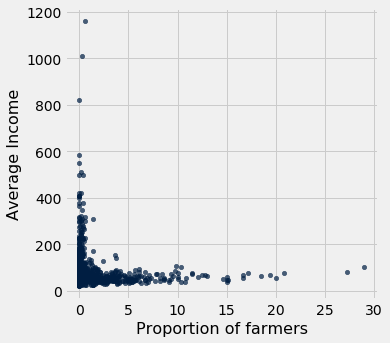

In [41]:
# Write code to make a scatter plot here.
income_per_zip = income
income_per_zip = income_per_zip.with_column('Average Income',income_per_zip.column(2)/income_per_zip.column(1),'Proportion of farmers',(income_per_zip.column(3)/income_per_zip.column(1)*100))              #
income_per_zip.scatter(5,4)                                             #add to the table with 2 columns of Proportion and average income and use those columns to scatter

**Question 2.8.** From the graph, can you say whether ZIP codes with more farmers typically have lower or higher average income than ZIP codes with few or no farmers?  Can you say how much lower or higher?

*Zipcodes that have more farmers tend to have lower total income values. The higher the proportion of farmers leads to lower total income. The areas that have no farmers have higher values of total income values. *

In [42]:
print(income_per_zip.sort('total income ($)', descending= True).column(2)[0])           #top income of few farmers
print(income_per_zip.sort('num farmers', descending= False).column(2)[0])               #top income of top farmers
print('This is the diffrence from the top income to the lowest income.')            
print(income_per_zip.sort('total income ($)', descending= True).column(2)[0]-income_per_zip.sort('num farmers', descending= False).column(2)[0])

8748862.0
1821160.0
This is the diffrence from the top income to the lowest income.
6927702.0


**Question 2.9.** Compare the average incomes for two groups of *tax returns*: those in ZIP codes with a greater-than-average proportion of farmers and those in ZIP codes with a less-than-average (or average) proportion. Make sure both of these values are displayed (preferably in a table). *Then, describe your findings.*

*Hint:* Make sure your result correctly accounts for the number of tax returns in each ZIP code, as in questions 2.5 and 2.6.

In [18]:
# Build and display a table with two rows:
#   1) incomes of returns in ZIP codes with a greater-than-average proportion of farmers
#   2) incomes of returns in other ZIP codes

# My solution used 11 lines of code.  Check the documentation if you need 
# a method for adding rows.

average_farm_proportion = income.column(3).sum()/income.num_rows                                   #the average about of farms
higher_than_avg = income.where('num farmers', are.above(int(average_farm_proportion)))             #the rows above farms
lower_than_avg = income.where('num farmers', are.below_or_equal_to(int(average_farm_proportion)))  #the rows brlow farms
income_higher_than_avg = higher_than_avg.column(2).sum()                                           #the income of higher rows
income_less_than_avg = lower_than_avg.column(2).sum()                                              #the income of lower rows
pop_higher = higher_than_avg.column(1).sum()                                                       #sum of pop higher
pop_low = lower_than_avg.column(1).sum()                                                           #sum of pop lower
income_farmers = Table(make_array('Proportion', 'Income'))                                         #table table
income_farmers.with_row(['Higher', (income_higher_than_avg/pop_higher)*1000]).with_row(['Lower', (income_less_than_avg/pop_low)*1000]) #make a new row

Proportion,Income
Higher,76592.8
Lower,71590.6


The higher proportion has higher income, I don't think that this is right since we see that areas with farmers make less. I think that the higher proportion should be a higher income. 

In [19]:
average_farm_proportion

30.850202429149796

**Question 2.10.** The graph below displays two histograms: the distribution of average incomes of ZIP codes that have above-average proportions of farmers, and that of ZIP codes with below-average proportions of farmers.

<img src="https://i.imgur.com/jicA2to.png"/>

Are ZIP codes with below-average proportions of farmers more or less likely to have very low incomes?  Explain how your answer is consistent with your answer to question 2.8.

*Zip codes that have more below average farmer proportions have a higher income distribution than of above average farmer proportion. But below average proportion overall make more than of some above average income farmers.  *

ZIP codes cover all the land in California and do not overlap. Here's a map of all of them.

<img src="california-zip-code-map.jpg" alt="CA ZIP Codes"/>

**Question 2.11.** Among the ZIP codes represented in the `incomes` table, is there an association between high average income and some aspect of the ZIP code's location? If so, describe one aspect of the location that is clearly associated with high income.

Answer the question by drawing a map of all ZIP codes that have an income above 100,000 dollars. *Then, describe an association that you observe.*

In order to create a map of certain ZIP codes, you need to:
- Construct a table containing only the ZIP codes of interest, called `high_average_zips`.
- Join `high_average_zips` with the `zip_features` table to find the region for each ZIP code of interest.
- Call `Map(...)` on the column of features (provided).

In [25]:
# Write code to draw a map of only the high-income ZIP codes.
# We have filled in some of it and suggested names for variables
# you might want to define.
zip_features = Table.from_records(zips.features)
high_zips = income.where(income.column(2),are.above(100000)).sort('total income ($)').column(0)
high_average_zips = Table().with_column('Zips', high_zips)
high_zips_with_region = zip_features.where('ZIP',are.contained_in(high_zips))
high_zips_with_region
#Map(high_zips_with_region.column('feature'), width=400, height=300)

ZIP   | feature                                                | id
94038 | <datascience.maps.Region object at 0x00000248DC05D710> | 0
94002 | <datascience.maps.Region object at 0x00000248DC05D9B0> | 6
94010 | <datascience.maps.Region object at 0x00000248DC05DA20> | 7
94015 | <datascience.maps.Region object at 0x00000248DC05DA90> | 8
94019 | <datascience.maps.Region object at 0x00000248DC05DB00> | 9
94025 | <datascience.maps.Region object at 0x00000248DC05DB70> | 10
94027 | <datascience.maps.Region object at 0x00000248DC05DBE0> | 11
94028 | <datascience.maps.Region object at 0x00000248DC05DC50> | 12
94030 | <datascience.maps.Region object at 0x00000248DC05DCC0> | 13
94044 | <datascience.maps.Region object at 0x00000248DC05DD30> | 14
... (1129 rows omitted)

*Write your answer here, replacing this text.*

Part 3: Water Usage
======
We will now investigate water usage in California. The `usage` table contains three columns:

- `PWSID`: The Public Water Supply Identifier of the district
- `Population`: Estimate of average population served in 2015
- `Water`: Average residential water use (gallons per person per day) in 2014-2015

In [37]:
# Run this cell to create the usage table.

usage_raw.set_format(4, NumberFormatter)
max_pop = usage_raw.select(0, 'population').group(0, max).relabeled(1, 'Population')
avg_water = usage_raw.select(0, 'res_gpcd').group(0, np.mean).relabeled(1, 'Water')
usage = max_pop.join('pwsid', avg_water).relabeled(0, 'PWSID')
usage

PWSID,Population,Water
0110001,340000,70.7
0110003,57450,90.2727
0110005,1390000,76
0110006,151037,57.1818
0110008,73067,96.6364
0110009,79547,68.6364
0110011,31994,85.8182
0310003,23347,82.8182
0410002,101447,142
0410005,11208,88.8182


**Question 3.1.** Draw a map of the water districts, colored by the per capita water usage in each district.

Use the `districts.color(...)` method to generate the map. It takes as its first argument a two-column table with one row per district that has the district `PWSID` as its first column. The label of the second column is used in the legend of the map, and the values are used to color each region.

In [46]:
# We have filled in the call to districts.color(...).  Set per_capita_usage
# to an appropriate table so that a map of all the water districts is
# displayed.
per_capita_usage = usage.with_column('Per capita water',usage.column(1)/usage.column(2))
per_capita_usage = usage.select(0,2)

districts.color(per_capita_usage, key_on='feature.properties.PWSID',palette='YlGnBu') 

C:\Users\lebri\Anaconda3\lib\site-packages\folium\folium.py:504: UserWarning: This method is deprecated. Please use Map.choropleth instead.
  warnings.warn('This method is deprecated. '


In [47]:
_ = tests.grade('q31')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 2
    Failed: 0
[ooooooooook] 100.0% passed



**Question 3.2.** Based on the map above, which part of California appears to use more water per person: the San Francisco area or the Los Angeles area? 

*The area of Los Angeles uses more water than of San Francisco. *

Next, we will try to match each ZIP code with a water district. ZIP code boundaries do not always line up with water districts, and one water district often covers multiple ZIP codes, so this process is imprecise. It is even the case that some water districts overlap each other. Nonetheless, we can continue our analysis by matching each ZIP code to the water district with the largest geographic overlap.

The table `wd_vs_zip` describes the proportion of land in each ZIP code that is contained in each water district and vice versa. (The proportions are approximate because they do not correctly account for discontiguous districts, but they're mostly accurate.)

In [48]:
wd_vs_zip

PWSID,ZIP,District in ZIP,ZIP in District
0110001,94536,9.41%,68.51%
0110001,94538,18.87%,67.31%
0110001,94539,13.13%,44.36%
0110005,94541,1.61%,68.11%
0110006,94541,18.68%,98.46%
0110005,94542,0.17%,6.79%
0110006,94542,18.24%,91.80%
0110001,94544,0.33%,3.02%
0110005,94544,0.00%,0.01%
0110006,94544,28.24%,97.61%


**Question 3.3.** Complete the `district_for_zip` function that takes a ZIP code as its argument. It returns the PWSID with the largest value of `ZIP in District` for that `zip_code`, if that value is at least 50%. Otherwise, it returns the string `'No District'`.

In [49]:
# def district_for_zip(zip_code):
#     zip_code = str(zip_code) # Ensure that the ZIP code is a string, not an integer
#     districts = wd_vs_zip
#     at_least_half = districts.where('ZIP',zip_code)
#     if at_least_half.num_rows:
#         PWISD = at_least_half.sort('ZIP in District', descending = True).column(0)[0]
#         if at_least_half.sort('ZIP in District', descending = True).column(3)[0] > .5:
#             return PWISD
#         else:
#             return 'No District'
#     else:
#             return 'No District'

# district_for_zip(94544)

In [33]:
def district_for_zip(zip_code):
    zip_code = str(zip_code) # Ensure that the ZIP code is a string, not an integer
    districts = wd_vs_zip.where('ZIP',zip_code)
    at_least_half = districts.where('ZIP in District',are.above_or_equal_to(.50))
    if at_least_half.num_rows:
        PWISD = at_least_half.sort('ZIP in District',descending= True).column(0)[0]
        return PWISD
    else:
        return 'No District'

district_for_zip(91106)

'1910124'

In [34]:
_ = tests.grade('q33')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 6
    Failed: 0
[ooooooooook] 100.0% passed



This function can be used to associate each ZIP code in the `income` table with a `PWSID` and discard ZIP codes that do not lie (mostly) in a water district.

In [35]:
zip_pwsids = income.apply(district_for_zip, 'ZIP')
zip_pwsids
income_with_pwsid = income.with_column('PWSID', zip_pwsids).where('PWSID', are.not_equal_to("No District"))
income_with_pwsid.set_format(2, NumberFormatter(0)).show(10)

ZIP,num returns,total income ($),num farmers,PWSID
90650,44600,"1,821,160",0,1910191
90250,42350,"1,744,745",0,1910134
94112,41780,"2,144,017",0,3810011
92683,40920,"1,887,629",0,3010064
94110,39300,"3,632,239",30,3810011
90280,39260,"1,270,489",0,1910152
90805,39240,"1,346,380",0,1910065
91911,38820,"1,566,167",0,3710025
92154,38790,"1,571,789",0,3710020
92704,38530,"1,365,544",0,3010038


**Question 3.4.** Create a table called `district_data` with one row per PWSID and the following columns:

- `PWSID`: The ID of the district
- `Population`: Population estimate
- `Water`: Average residential water use (gallons per person per day) in 2014-2015
- `Income`: Average income in dollars of all tax returns in ZIP codes that are (mostly) contained in the district according to `income_with_pwsid`.

*Hint*: First create a `district_income` table that sums the incomes and returns for ZIP codes in each water district.

In [38]:
district_income = income_with_pwsid.group('PWSID',sum)
income_avg = district_income.column(3)/district_income.column(2)*1000
district_income= district_income.with_column('Income',income_avg)
district_join = district_income.join('PWSID',usage)
district_data = district_join.select(0,6,7,5)
district_data.set_format(make_array('Population', 'Water', 'Income'), NumberFormatter(0))

PWSID,Population,Water,Income
0110001,"340,000",71,"79,032"
0110005,"1,390,000",76,"82,497"
0110006,"151,037",57,"52,924"
0110008,"73,067",97,"163,257"
0110009,"79,547",69,"133,902"
0410002,"101,447",142,"50,401"
0410006,"18,300",286,"38,721"
0410011,"9,615",92,"44,707"
0710001,"106,455",110,"53,551"
0710003,"197,536",102,"73,914"


In [ ]:
_ = tests.grade('q34')

**Question 3.5.** The `bay_districts` table gives the names of all water districts in the San Francisco Bay Area. Is there an association between water usage and income among Bay Area water districts? Use the tables you have created to compare water usage between the 10 Bay Area water districts with the highest average income and the rest of the Bay Area districts, then describe the association. *Do not include any districts in your analysis for which you do not have income information.*

The names below are just suggestions; you may perform the analysis in any way you wish.

*Note*: Some Bay Area water districts may not appear in your `district_data` table. That's ok. Perform your analysis only on the subset of districts where you have both water usage & income information.

In [294]:
bay_districts = Table.read_table('bay_districts.csv')
water_usage = usage_raw.join('wsname', bay_districts, 'District').group(('wsname','pwsid')).select(0,1)
water_usage_top10 = water_usage.join('pwsid',district_data,'PWSID').relabel('wsname','District').relabel('pwsid','PWSID').sort('Income',descending = True).take(range(0,10))
water_usage_top10_water = water_usage_top10.column(3).sum()/water_usage_top10.num_rows


water_usage_rest = water_usage.join('pwsid',district_data,'PWSID').relabel('wsname','District').relabel('pwsid','PWSID').sort('Income',descending = True).take(range(10,29))
water_usage_rest_water = water_usage_rest.column(3).sum()/water_usage_rest.num_rows



water_usage_top10_water - water_usage_rest_water

24.645454545454541

*Complete this one-sentence conclusion:* In the Bay Area, people in the top 10 highest-income water districts used an average of `24.645` more gallons of water per person per day than people in the rest of the districts.

**Question 3.6.** In one paragraph, summarize what you have discovered through the analyses in this project and suggest what analysis should be conducted next to better understand California water usage, income, and geography. What additional data would be helpful in performing this next analysis?

Looking at the data, most of California's water usage is in highly populated areas such as cities. The amount of water also changes based on the type of use the land is such as farming or residential uses. If we look at the porportion of farmers and the income, there are many zip codes that are grouped together that have a small to none amount of farmer porportion that make reletively the same as areas that have higher farming porportions. We also see the large spread of water districts to each zip code as they a larger area than of zip codes sometimes. 

I think that if we take from older studies such as John Snow by seeing where water comes from such as reservoirs, water stations and rain flow of water. These factors can also be included to further see in detail of water usage. Seeing these numbers can also help in past drought areas and see if we can change where water is drown. This can also help build farm land in areas that receive more water than of drought. We can use this to help build more water treatment areas that are growing in popualtion and stop an issue of a shortage of water in the future. 

CCongratulations - you've finished Project 1 of Data 3401! 

To submit:

1. Select `Run All` from the `Cell` menu to ensure that you have executed all cells, including the test cells.  Make sure that the visualizations you create are actually displayed.
2. Upload  your completed jupyter notebook to BlackBoard.

In [291]:
# For your convenience, you can run this cell to run all the tests at once!
import os
_ = [tests.grade(q[:-3]) for q in os.listdir("tests") if q.startswith('q')]

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 2
    Failed: 0
[ooooooooook] 100.0% passed

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 2
    Failed: 0
[ooooooooook] 100.0% passed

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Test summary
    Passed: 1
    Failed: 0
[ooooooooook] 100.0% passed

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Running tests

---------------------------------------------------------------------
Question > Suite 1 > Case 2

>>> income.take([0, 1, 2])
ZIP   | num returns | total income ($) | num farmers
90650 | 44600       | 1,821,160        | 0
90250 | 42350     

If you want, draw some more maps below.

In [57]:
# Your extensions here (completely optional)

In [292]:
# I think that I could have used .mean for some of the functions but i found it better to find sum and divide. I can see the values and how we got it. 